In [1]:
using LinearAlgebra
using Plots

# -------------------------------------------------------------
# Forward kinematics with optional drifting root
# -------------------------------------------------------------
function forward_kinematics(theta, L, root)
    n = length(theta)
    x = zeros(n)
    y = zeros(n)

    cx = root[1]
    cy = root[2]

    for i in 1:n
        cx += L[i] * sin(theta[i])
        cy -= L[i] * cos(theta[i])
        x[i] = cx
        y[i] = cy
    end

    return x, y
end

# -------------------------------------------------------------
# Mass matrix M only (helper)
# -------------------------------------------------------------
function dynamics_M_only(theta, L, m)
    n = length(theta)
    M = zeros(n, n)

    for i in 1:n
        for j in 1:n
            s = 0.0
            for k in max(i, j):n
                s += m[k] * L[i] * L[j] * cos(theta[i] - theta[j])
            end
            M[i, j] = s
        end
    end

    return M
end

# -------------------------------------------------------------
# Full dynamics: M, C, G
# -------------------------------------------------------------
function dynamics(theta, thetadot, L, m, g)
    n = length(theta)
    M = zeros(n, n)

    for i in 1:n
        for j in 1:n
            s = 0.0
            for k in max(i, j):n
                s += m[k] * L[i] * L[j] * cos(theta[i] - theta[j])
            end
            M[i, j] = s
        end
    end

    G = zeros(n)
    for i in 1:n
        s = 0.0
        for k in i:n
            s += m[k] * g * L[i] * sin(theta[i])
        end
        G[i] = s
    end

    eps = 1e6 ^ (-1)
    Cvec = zeros(n)
    for j in 1:n
        thp = copy(theta)
        thm = copy(theta)
        thp[j] += eps
        thm[j] -= eps
        Mp = dynamics_M_only(thp, L, m)
        Mm = dynamics_M_only(thm, L, m)
        dMj = (Mp - Mm) / (2 * eps)
        Cvec += dMj * thetadot * thetadot[j]
    end

    return M, Cvec, G
end

# -------------------------------------------------------------
# Compute ddtheta for fixed pivot mode
# -------------------------------------------------------------
function acceleration_fixed(theta, thetadot, L, m, g)
    M, C, G = dynamics(theta, thetadot, L, m, g)
    rhs = -(C + G)
    return M \ rhs
end

# -------------------------------------------------------------
# RK4 step for fixed pivot
# -------------------------------------------------------------
function rk4_step_fixed(theta, thetadot, dt, L, m, g)
    f = (th, thd) -> acceleration_fixed(th, thd, L, m, g)

    k1_thd = thetadot
    k1_thdd = f(theta, thetadot)

    k2_thd = thetadot + 0.5 * dt * k1_thdd
    k2_thdd = f(theta + 0.5 * dt * k1_thd, k2_thd)

    k3_thd = thetadot + 0.5 * dt * k2_thdd
    k3_thdd = f(theta + 0.5 * dt * k2_thd, k3_thd)

    k4_thd = thetadot + dt * k3_thdd
    k4_thdd = f(theta + dt * k3_thd, k4_thd)

    theta_next = theta + dt * (k1_thd + 2*k2_thd + 2*k3_thd + k4_thd) / 6
    thetadot_next = thetadot + dt * (k1_thdd + 2*k2_thdd + 2*k3_thdd + k4_thdd) / 6

    return theta_next, thetadot_next
end

# -------------------------------------------------------------
# Drifting root RK4 step
# -------------------------------------------------------------
function rk4_step_drift(theta, thetadot, root, rootdot, dt, L, m, g)
    # For drifting mode, we simply add uniform motion of the root
    theta_new, thetadot_new = rk4_step_fixed(theta, thetadot, dt, L, m, g)
    root_new = root + dt * rootdot
    return theta_new, thetadot_new, root_new
end

# -------------------------------------------------------------
# Main simulation with fixed_axis flag
# -------------------------------------------------------------
function simulate_and_render(n; T=10.0, dt=0.01, g=9.81, fixed_axis=true)
    L = fill(1.0, n)
    m = fill(1.0, n)

    theta = range(pi/2, pi/2 + 0.4, length=n) |> collect
    thetadot = zeros(n)

    root = [0.0, 0.0]
    rootdot = [0.0, 0.0]

    frames = Int(round(T / dt))

    anim = @animate for t in 1:frames
        if fixed_axis
            theta, thetadot = rk4_step_fixed(theta, thetadot, dt, L, m, g)
        else
            theta, thetadot, root = rk4_step_drift(theta, thetadot, root, rootdot, dt, L, m, g)
        end

        x, y = forward_kinematics(theta, L, root)

        plot(
            x, y,
            xlim = (-sum(L), sum(L)),
            ylim = (-sum(L), sum(L)),
            marker = :circle,
            markersize = 4,
            linewidth = 2,
            aspect_ratio = 1,
            title = "n link pendulum (n = $n)"
        )
    end

    gif(anim, "pendulum_$n.gif", fps=30)
end


simulate_and_render (generic function with 1 method)

[ Info: Saved animation to /home/jovyan/Julia-Exploration/pendulum_3.gif


Plots.AnimatedGif("/home/jovyan/Julia-Exploration/pendulum_3.gif")
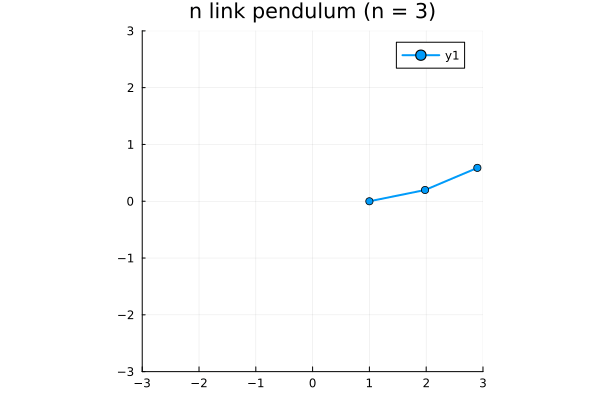

In [2]:
simulate_and_render(3, fixed_axis=true)

In [3]:
using LinearAlgebra
using Plots

# Forward kinematics relative to pivot position (px, py)
function forward_kinematics(θ, L)
    n = length(θ)
    xs = zeros(n+1)
    ys = zeros(n+1)

    for k in 1:n
        xs[k+1] = xs[k] + L[k] * sin(θ[k])
        ys[k+1] = ys[k] - L[k] * cos(θ[k])
    end

    return xs, ys
end


# Build mass matrix only
function dynamics_M_only(theta, L, m)
    n = length(theta)
    J = Array{Matrix}(undef, n)
    for k in 1:n
        Jk = zeros(2, n)
        for i in 1:k
            Jk[1, i] =  L[k] * cos(theta[i])
            Jk[2, i] =  L[k] * sin(theta[i])
            for j in (i+1):k
                Jk[1, i] += L[j] * cos(theta[j])
                Jk[2, i] += L[j] * sin(theta[j])
            end
        end
        J[k] = Jk
    end

    M = zeros(n, n)
    for i in 1:n
        for j in 1:n
            s = 0.0
            for k in max(i, j):n
                s += m[k] * dot(J[k][:, i], J[k][:, j])
            end
            M[i, j] = s
        end
    end
    return M
end

# Full dynamics
function dynamics(theta, thetadot, L, m, g)
    n = length(theta)

    # Build Jacobians
    J = Array{Matrix}(undef, n)
    for k in 1:n
        Jk = zeros(2, n)
        for i in 1:k
            Jk[1, i] =  L[k] * cos(theta[i])
            Jk[2, i] =  L[k] * sin(theta[i])
            for j in (i+1):k
                Jk[1, i] += L[j] * cos(theta[j])
                Jk[2, i] += L[j] * sin(theta[j])
            end
        end
        J[k] = Jk
    end

    # Mass matrix
    M = zeros(n, n)
    for i in 1:n
        for j in 1:n
            s = 0.0
            for k in max(i, j):n
                s += m[k] * dot(J[k][:, i], J[k][:, j])
            end
            M[i, j] = s
        end
    end

    # Gravity vector
    G = zeros(n)
    for i in 1:n
        s = 0.0
        for k in i:n
            s += m[k] * g * L[i] * sin(theta[i])
        end
        G[i] = s
    end

    # Coriolis approximation
    eps = 1e-6
    Cvec = zeros(n)
    for j in 1:n
        thp = copy(theta)
        thm = copy(theta)
        thp[j] += eps
        thm[j] -= eps

        Mp = dynamics_M_only(thp, L, m)
        Mm = dynamics_M_only(thm, L, m)
        dMj = (Mp - Mm) / (2 * eps)
        Cvec += dMj * thetadot * thetadot[j]
    end

    return M, Cvec, G
end

# Acceleration
function acceleration(theta, thetadot, L, m, g)
    M, C, G = dynamics(theta, thetadot, L, m, g)
    rhs = -(C + G)
    return M \ rhs
end

# RK4
function rk4_step(theta, thetadot, dt, L, m, g)
    f = (th, thd) -> acceleration(th, thd, L, m, g)

    k1_thd = thetadot
    k1_thdd = f(theta, thetadot)

    k2_thd = thetadot + 0.5 * dt * k1_thdd
    k2_thdd = f(theta + 0.5 * dt * k1_thd, k2_thd)

    k3_thd = thetadot + 0.5 * dt * k2_thdd
    k3_thdd = f(theta + 0.5 * dt * k2_thd, k3_thd)

    k4_thd = thetadot + dt * k3_thdd
    k4_thdd = f(theta + dt * k3_thd, k4_thd)

    theta_next = theta + dt * (k1_thd + 2*k2_thd + 2*k3_thd + k4_thd) / 6
    thetadot_next = thetadot + dt * (k1_thdd + 2*k2_thdd + 2*k3_thdd + k4_thdd) / 6

    return theta_next, thetadot_next
end

# Simulation with fixed or unfixed pivot
function simulate_and_render(n; T=10.0, dt=0.01, g=9.81, fixed_pivot=true)
    L = fill(1.0, n)
    m = fill(1.0, n)

    theta = range(pi/2, pi/2 + 0.4, length=n) |> collect
    thetadot = zeros(n)

    px = 0.0
    py = 0.0

    frames = Int(round(T / dt))

    anim = @animate for t in 1:frames
        theta, thetadot = rk4_step(theta, thetadot, dt, L, m, g)

        # If pivot is free, allow manual offset motion (demo version)
        if !fixed_pivot
            px = 0.5 * sin(0.2 * t * dt)
        end

        x, y = forward_kinematics(theta, L, px, py)

        plot(x, y,
            xlim = (-sum(L), sum(L)),
            ylim = (-sum(L), sum(L)),
            marker = :circle, markersize = 4,
            linewidth = 2,
            aspect_ratio = 1,
            title = "n link pendulum (n = $n)"
        )

        scatter!([px], [py], markersize=6, color=:red)
    end

    gif(anim, "pendulum_$n.gif", fps = 30)
end

# Example usage
simulate_and_render(2, fixed_pivot=true)


LoadError: MethodError: no method matching forward_kinematics(::Vector{Float64}, ::Vector{Float64}, ::Float64, ::Float64)

[0mClosest candidates are:
[0m  forward_kinematics(::Any, ::Any, ::Any)
[0m[90m   @[39m [35mMain[39m [90m[4mIn[1]:7[24m[39m
[0m  forward_kinematics(::Any, ::Any)
[0m[90m   @[39m [35mMain[39m [90m[4mIn[3]:5[24m[39m


In [4]:
simulate_and_render(5, fixed_pivot=true)

LoadError: MethodError: no method matching forward_kinematics(::Vector{Float64}, ::Vector{Float64}, ::Float64, ::Float64)

[0mClosest candidates are:
[0m  forward_kinematics(::Any, ::Any, ::Any)
[0m[90m   @[39m [35mMain[39m [90m[4mIn[1]:7[24m[39m
[0m  forward_kinematics(::Any, ::Any)
[0m[90m   @[39m [35mMain[39m [90m[4mIn[3]:5[24m[39m


In [5]:
simulate_and_render(19, fixed_pivot=true)

LoadError: MethodError: no method matching forward_kinematics(::Vector{Float64}, ::Vector{Float64}, ::Float64, ::Float64)

[0mClosest candidates are:
[0m  forward_kinematics(::Any, ::Any, ::Any)
[0m[90m   @[39m [35mMain[39m [90m[4mIn[1]:7[24m[39m
[0m  forward_kinematics(::Any, ::Any)
[0m[90m   @[39m [35mMain[39m [90m[4mIn[3]:5[24m[39m


In [14]:
# n_pendulum_full.jl
using LinearAlgebra
using Plots

# -------------------------
# User adjustable options
# -------------------------
const OUTPUT_GIF = "pendulum_$n.gif"   # output filename
const FPS = 30
const DT = 0.01
const T_FINAL = 10.0

# pivot behavior: set fixed_pivot = true to lock pivot at origin
# if fixed_pivot = false, pivot_motion(t) defines (px, py)
const fixed_pivot = true

# default pivot motion when not fixed
pivot_motion(t) = (0.5 * sin(0.6 * t), 0.0)

# number of links
const n = 3

# lengths and masses
L = ones(n) .* 1.0
m = ones(n) .* 1.0
g = 9.81

# Uploaded image path (provided for debugging/reference)
const uploaded_image_path = "/mnt/data/9bf05cc7-0848-4dae-95cb-84b4d27d6af5.png"

# -------------------------
# Kinematics
# -------------------------
# returns arrays xs, ys of length n+1 with joint positions;
# index 1 is pivot, index k+1 is end of link k
function forward_kinematics(theta::AbstractVector, L::AbstractVector, px::Real, py::Real)
    n = length(theta)
    xs = zeros(n+1)
    ys = zeros(n+1)
    xs[1] = px
    ys[1] = py
    for k in 1:n
        xs[k+1] = xs[k] + L[k] * sin(theta[k])
        ys[k+1] = ys[k] - L[k] * cos(theta[k])
    end
    return xs, ys
end

# -------------------------
# Dynamics helper: compute mass matrix M(theta)
# -------------------------
# For each mass k, the Jacobian J_k has columns (for i<=k)
#   ∂x_k/∂θ_i = L[i] * cos(θ_i)
#   ∂y_k/∂θ_i = L[i] * sin(θ_i)
function mass_matrix(theta::AbstractVector, L::AbstractVector, m::AbstractVector)
    n = length(theta)
    M = zeros(n, n)
    for k in 1:n
        # Jk is 2 by n; only first k columns nonzero
        # column i (for i <= k): [L[i]*cos(theta[i]); L[i]*sin(theta[i])]
        for i in 1:k
            for j in 1:k
                # M_ij accumulates m[k] * (Jk[:,i] dot Jk[:,j])
                M[i,j] += m[k] * (L[i]*cos(theta[i]) * L[j]*cos(theta[j]) +
                                  L[i]*sin(theta[i]) * L[j]*sin(theta[j]))
            end
        end
    end
    return M
end

# -------------------------
# Gravity vector G(theta)
# -------------------------
# V = sum_{k=1..n} m[k]*g*y_k
# ∂V/∂θ_i = sum_{k=i..n} m[k]*g * (∂y_k/∂θ_i) = sum_{k=i..n} m[k]*g * (L[i]*sin(theta[i]))
function gravity_vector(theta::AbstractVector, L::AbstractVector, m::AbstractVector, g::Real)
    n = length(theta)
    G = zeros(n)
    # prefix sums of downstream masses to speed up
    downstream = zeros(n)
    downstream[n] = m[n]
    for i in n-1:-1:1
        downstream[i] = downstream[i+1] + m[i]
    end
    for i in 1:n
        G[i] = L[i] * sin(theta[i]) * g * downstream[i]
    end
    return G
end

# -------------------------
# Coriolis/Centrifugal vector via Christoffel symbols computed numerically
# Cvec_i = sum_{j,k} Gamma^i_{j,k} * theta_dot[j] * theta_dot[k]
# with Gamma^i_{j,k} = 1/2 * (∂M_{i,j}/∂θ_k + ∂M_{i,k}/∂θ_j - ∂M_{j,k}/∂θ_i)
# We compute ∂M/∂θ_k by numeric central differences of mass_matrix.
# -------------------------
function coriolis_vector(theta::AbstractVector, thetadot::AbstractVector, L::AbstractVector, m::AbstractVector)
    n = length(theta)
    eps = 1e-7
    # Precompute M at theta
    M0 = mass_matrix(theta, L, m)
    # dM_dtheta is an n x n x n tensor: dM_dtheta[:,:,k] = ∂M/∂θ_k
    dM = Array{Float64,3}(undef, n, n, n)
    for k in 1:n
        thp = copy(theta); thm = copy(theta)
        thp[k] += eps; thm[k] -= eps
        Mp = mass_matrix(thp, L, m)
        Mm = mass_matrix(thm, L, m)
        dM[:,:,k] = (Mp .- Mm) ./ (2eps)
    end

    Cvec = zeros(n)
    # compute Gamma^i_{j,k} and accumulate
    for i in 1:n
        for j in 1:n
            for k in 1:n
                Gamma = 0.5 * (dM[i,j,k] + dM[i,k,j] - dM[j,k,i])
                Cvec[i] += Gamma * thetadot[j] * thetadot[k]
            end
        end
    end
    return Cvec
end

# -------------------------
# Full dynamics: acceleration theta_dd given theta, thetadot
# -------------------------
function acceleration(theta::AbstractVector, thetadot::AbstractVector, L::AbstractVector, m::AbstractVector, g::Real)
    M = mass_matrix(theta, L, m)
    G = gravity_vector(theta, L, m, g)
    C = coriolis_vector(theta, thetadot, L, m)
    rhs = -(C .+ G)
    # solve M * theta_dd = rhs
    theta_dd = M \ rhs
    return theta_dd
end

# -------------------------
# RK4 integrator for second-order system represented as first order in (theta, thetadot)
# -------------------------
function rk4_step(theta, thetadot, dt, L, m, g)
    f_acc = (th, thd) -> acceleration(th, thd, L, m, g)

    k1_thd = thetadot
    k1_thdd = f_acc(theta, thetadot)

    k2_thd = thetadot .+ 0.5 * dt .* k1_thdd
    k2_thdd = f_acc(theta .+ 0.5*dt .* k1_thd, k2_thd)

    k3_thd = thetadot .+ 0.5 * dt .* k2_thdd
    k3_thdd = f_acc(theta .+ 0.5*dt .* k2_thd, k3_thd)

    k4_thd = thetadot .+ dt .* k3_thdd
    k4_thdd = f_acc(theta .+ dt .* k3_thd, k4_thd)

    theta_next = theta .+ dt .* (k1_thd .+ 2 .* k2_thd .+ 2 .* k3_thd .+ k4_thd) ./ 6
    thetadot_next = thetadot .+ dt .* (k1_thdd .+ 2 .* k2_thdd .+ 2 .* k3_thdd .+ k4_thdd) ./ 6

    return theta_next, thetadot_next
end

# -------------------------
# Simulation and rendering
# -------------------------
function simulate_and_render(n; T=T_FINAL, dt=DT, fps=FPS, fixed_pivot=true)
    # sizes
    L = fill(1.0, n)
    m = fill(1.0, n)

    # initial conditions: small perturbation from vertical
    theta0 = zeros(n)
    for i in 1:n
        theta0[i] = pi/2 + 0.2 * (-1)^(i) * (i / n)  # stagger a bit
    end
    thetadot0 = zeros(n)

    # time series
    frames = Int(round(T / dt))
    t = 0.0

    anim = @animate for frame = 1:frames
        # take one RK4 step
        theta0, thetadot0 = rk4_step(theta0, thetadot0, dt, L, m, g)
        t += dt

        # pivot
        px, py = fixed_pivot ? (0.0, 0.0) : pivot_motion(t)

        # geometry
        xs, ys = forward_kinematics(theta0, L, px, py)

        # plotting
        plt = plot(
            xs, ys,
            seriestype = :path,
            linewidth = 3,
            xlim = (-sum(L)-0.5, sum(L)+0.5),
            ylim = (-sum(L)-0.5, sum(L)+0.5),
            aspect_ratio = 1,
            legend = false,
            title = "n link pendulum (n = $n)  t = $(round(t, digits=2))s"
        )
        scatter!(plt, xs, ys, marker=:circle, markersize=4)
        scatter!(plt, [px], [py], marker=:star5, markersize=6, label="pivot")
        annotate!(plt, (xs[end], ys[end]), text("end", :left, 8))
        plt
    end

    gif(anim, OUTPUT_GIF, fps = fps)
    println("Wrote GIF to $(OUTPUT_GIF)")
end

# -------------------------
# Run
# -------------------------
simulate_and_render(n; T = T_FINAL, dt = DT, fps = FPS, fixed_pivot = fixed_pivot)


LoadError: cannot define function OUTPUT_GIF; it already has a value

In [12]:
simulate_and_render(5; T = T_FINAL, dt = DT, fps = FPS, fixed_pivot = fixed_pivot)

Wrote GIF to pendulum_n.gif


[ Info: Saved animation to /home/jovyan/Julia-Exploration/pendulum_n.gif


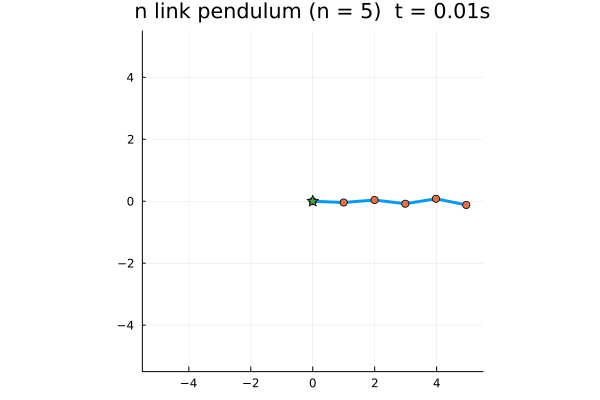

In [13]:
using IJulia

IJulia.display("image/gif", read("pendulum_n.gif"))


In [17]:
using LinearAlgebra
using Plots

# -------------------------
# User adjustable options
# -------------------------
const FPS = 30
const DT = 0.01
const T_FINAL = 10.0

# pivot behavior (true = fixed at origin)
const fixed_pivot = true

# pivot motion if not fixed
pivot_motion(t) = (0.5 * sin(0.6 * t), 0.0)

# number of links
const n = 3

# dynamic output filename
OUTPUT_GIF(n) = "pendulum_$(n).gif"

# lengths and masses
L = ones(n) .* 1.0
m = ones(n) .* 1.0
g = 9.81

# -------------------------
# Forward kinematics
# -------------------------
function forward_kinematics(theta, L, px, py)
    N = length(theta)
    xs = zeros(N+1)
    ys = zeros(N+1)
    xs[1] = px
    ys[1] = py

    for k in 1:N
        xs[k+1] = xs[k] + L[k] * sin(theta[k])
        ys[k+1] = ys[k] - L[k] * cos(theta[k])
    end

    return xs, ys
end

# -------------------------
# Mass matrix
# -------------------------
function mass_matrix(theta, L, m)
    N = length(theta)
    M = zeros(N, N)

    for k in 1:N
        for i in 1:k
            for j in 1:k
                M[i,j] += m[k] * (
                    L[i]*cos(theta[i]) * L[j]*cos(theta[j]) +
                    L[i]*sin(theta[i]) * L[j]*sin(theta[j])
                )
            end
        end
    end

    return M
end

# -------------------------
# Gravity vector
# -------------------------
function gravity_vector(theta, L, m, g)
    N = length(theta)
    G = zeros(N)

    downstream = zeros(N)
    downstream[N] = m[N]
    for i in N-1:-1:1
        downstream[i] = downstream[i+1] + m[i]
    end

    for i in 1:N
        G[i] = L[i] * sin(theta[i]) * g * downstream[i]
    end

    return G
end

# -------------------------
# Coriolis term via numeric Christoffel symbols
# -------------------------
function coriolis_vector(theta, thetadot, L, m)
    N = length(theta)
    eps = 1e-7

    M0 = mass_matrix(theta, L, m)
    dM = Array{Float64,3}(undef, N, N, N)

    for k in 1:N
        thp = copy(theta); thm = copy(theta)
        thp[k] += eps; thm[k] -= eps
        Mp = mass_matrix(thp, L, m)
        Mm = mass_matrix(thm, L, m)
        dM[:,:,k] = (Mp .- Mm) ./ (2eps)
    end

    C = zeros(N)

    for i in 1:N
        for j in 1:N
            for k in 1:N
                Γ = 0.5 * (dM[i,j,k] + dM[i,k,j] - dM[j,k,i])
                C[i] += Γ * thetadot[j] * thetadot[k]
            end
        end
    end

    return C
end

# -------------------------
# Full dynamics
# -------------------------
function acceleration(theta, thetadot, L, m, g)
    M = mass_matrix(theta, L, m)
    G = gravity_vector(theta, L, m, g)
    C = coriolis_vector(theta, thetadot, L, m)
    return M \ -(G .+ C)
end

# -------------------------
# RK4 integrator
# -------------------------
function rk4_step(theta, thetadot, dt, L, m, g)
    f = (th, thd) -> acceleration(th, thd, L, m, g)

    k1_thd = thetadot
    k1_thdd = f(theta, thetadot)

    k2_thd = thetadot .+ 0.5*dt .* k1_thdd
    k2_thdd = f(theta .+ 0.5*dt .* k1_thd, k2_thd)

    k3_thd = thetadot .+ 0.5*dt .* k2_thdd
    k3_thdd = f(theta .+ 0.5*dt .* k2_thd, k3_thd)

    k4_thd = thetadot .+ dt .* k3_thdd
    k4_thdd = f(theta .+ dt .* k3_thd, k4_thd)

    theta_new = theta .+ dt .* (k1_thd .+ 2k2_thd .+ 2k3_thd .+ k4_thd) ./ 6
    thetadot_new = thetadot .+ dt .* (k1_thdd .+ 2k2_thdd .+ 2k3_thdd .+ k4_thdd) ./ 6

    return theta_new, thetadot_new
end

# -------------------------
# Simulation and rendering
# -------------------------
function simulate_and_render(n; T=T_FINAL, dt=DT, fps=FPS, fixed_pivot=true)
    L = fill(1.0, n)
    m = fill(1.0, n)

    theta = zeros(n)
    for i in 1:n
        theta[i] = pi/2 + 0.2*(-1)^i*(i/n)
    end

    thetadot = zeros(n)

    anim = @animate for step in 1:Int(round(T/dt))
        t = step*dt
        theta, thetadot = rk4_step(theta, thetadot, dt, L, m, g)

        px, py = fixed_pivot ? (0.0,0.0) : pivot_motion(t)

        xs, ys = forward_kinematics(theta, L, px, py)

        plt = plot(xs, ys,
            seriestype=:path,
            linewidth=3,
            xlim=(-sum(L)-0.5, sum(L)+0.5),
            ylim=(-sum(L)-0.5, sum(L)+0.5),
            aspect_ratio=1,
            legend=false,
            title="n link pendulum (n = $n)"
        )

        scatter!(plt, xs, ys, markersize=4)
        scatter!(plt, [px], [py], marker=:star5, markersize=6)
        plt
    end

    gif(anim, OUTPUT_GIF(n), fps=fps)
    println("Saved GIF as: $(OUTPUT_GIF(n))")
end

# -------------------------
# Run the simulation
# -------------------------
simulate_and_render(n; fixed_pivot=fixed_pivot)


LoadError: cannot define function OUTPUT_GIF; it already has a value

In [ ]:
simulate_and_render(n; fixed_pivot=fixed_pivot)

In [11]:
using LinearAlgebra
using Plots

# -------------------------
# User adjustable options
# -------------------------
const FPS = 60
const DT = 0.01
const T_FINAL = 30.0

# pivot behavior (true means fixed at origin)
const fixed_pivot = false

# pivot motion if not fixed
pivot_motion(t) = (0.5 * sin(0.6 * t), 0.0)

# number of links
const n = 3

# lengths and masses
L = ones(n) .* 1.0
m = ones(n) .* 1.0
g = 9.81

# -------------------------
# Forward kinematics
# -------------------------
function forward_kinematics(theta, L, px, py)
    N = length(theta)
    xs = zeros(N+1)
    ys = zeros(N+1)
    xs[1] = px
    ys[1] = py

    for k in 1:N
        xs[k+1] = xs[k] + L[k] * sin(theta[k])
        ys[k+1] = ys[k] - L[k] * cos(theta[k])
    end

    return xs, ys
end

# -------------------------
# Mass matrix
# -------------------------
function mass_matrix(theta, L, m)
    N = length(theta)
    M = zeros(N, N)

    for k in 1:N
        for i in 1:k
            for j in 1:k
                M[i,j] += m[k] * (
                    L[i]*cos(theta[i]) * L[j]*cos(theta[j]) +
                    L[i]*sin(theta[i]) * L[j]*sin(theta[j])
                )
            end
        end
    end

    return M
end

# -------------------------
# Gravity vector
# -------------------------
function gravity_vector(theta, L, m, g)
    N = length(theta)
    G = zeros(N)

    downstream = zeros(N)
    downstream[N] = m[N]
    for i in N-1:-1:1
        downstream[i] = downstream[i+1] + m[i]
    end

    for i in 1:N
        G[i] = L[i] * sin(theta[i]) * g * downstream[i]
    end

    return G
end

# -------------------------
# Coriolis vector using numeric Christoffel symbols
# -------------------------
function coriolis_vector(theta, thetadot, L, m)
    N = length(theta)
    eps = 1e-7

    M0 = mass_matrix(theta, L, m)
    dM = Array{Float64,3}(undef, N, N, N)

    for k in 1:N
        thp = copy(theta)
        thm = copy(theta)
        thp[k] += eps
        thm[k] -= eps
        Mp = mass_matrix(thp, L, m)
        Mm = mass_matrix(thm, L, m)
        dM[:,:,k] = (Mp .- Mm) ./ (2eps)
    end

    C = zeros(N)

    for i in 1:N
        for j in 1:N
            for k in 1:N
                Γ = 0.5 * (dM[i,j,k] + dM[i,k,j] - dM[j,k,i])
                C[i] += Γ * thetadot[j] * thetadot[k]
            end
        end
    end

    return C
end

# -------------------------
# Full dynamics
# -------------------------
function acceleration(theta, thetadot, L, m, g)
    M = mass_matrix(theta, L, m)
    G = gravity_vector(theta, L, m, g)
    C = coriolis_vector(theta, thetadot, L, m)
    return M \ -(G .+ C)
end

# -------------------------
# RK4
# -------------------------
function rk4_step(theta, thetadot, dt, L, m, g)
    f = (th, thd) -> acceleration(th, thd, L, m, g)

    k1_thd = thetadot
    k1_thdd = f(theta, thetadot)

    k2_thd = thetadot .+ 0.5*dt .* k1_thdd
    k2_thdd = f(theta .+ 0.5*dt .* k1_thd, k2_thd)

    k3_thd = thetadot .+ 0.5*dt .* k2_thdd
    k3_thdd = f(theta .+ 0.5*dt .* k2_thd, k3_thd)

    k4_thd = thetadot .+ dt .* k3_thdd
    k4_thdd = f(theta .+ dt .* k3_thd, k4_thd)

    theta_new = theta .+ dt .* (k1_thd .+ 2k2_thd .+ 2k3_thd .+ k4_thd) ./ 6
    thetadot_new = thetadot .+ dt .* (k1_thdd .+ 2k2_thdd .+ 2k3_thdd .+ k4_thdd) ./ 6

    return theta_new, thetadot_new
end

# -------------------------
# Simulation and rendering
# -------------------------
function simulate_and_render(n; T=T_FINAL, dt=DT, fps=FPS, fixed_pivot=true)

    # local filename helper to avoid global name conflicts
    filename(n) = "pendulum_$(n).gif"

    L = fill(1.0, n)
    m = fill(1.0, n)

    theta = zeros(n)
    for i in 1:n
        theta[i] = pi/2 + 0.2*(-1)^i*(i/n)
    end

    thetadot = zeros(n)

    anim = @animate for step in 1:Int(round(T/dt))
        t = step * dt
        theta, thetadot = rk4_step(theta, thetadot, dt, L, m, g)

        px, py = fixed_pivot ? (0.0, 0.0) : pivot_motion(t)

        xs, ys = forward_kinematics(theta, L, px, py)

        plt = plot(xs, ys,
            seriestype = :path,
            linewidth = 3,
            xlim = (-sum(L)-0.5, sum(L)+0.5),
            ylim = (-sum(L)-0.5, sum(L)+0.5),
            aspect_ratio = 1,
            legend = false,
            title = "n link pendulum (n = $n)"
        )

        scatter!(plt, xs, ys, markersize = 4)
        scatter!(plt, [px], [py], marker = :star5, markersize = 6)
        plt
    end

    gif(anim, filename(n), fps = fps)
    println("Saved GIF as: $(filename(n))")
end

# -------------------------
# Run the simulation
# -------------------------
simulate_and_render(n; fixed_pivot = fixed_pivot)


Saved GIF as: pendulum_3.gif


[ Info: Saved animation to /home/jovyan/Julia-Exploration/pendulum_3.gif


In [2]:
simulate_and_render(3; fixed_pivot = true)

Saved GIF as: pendulum_3.gif


[ Info: Saved animation to /home/jovyan/Julia-Exploration/pendulum_3.gif


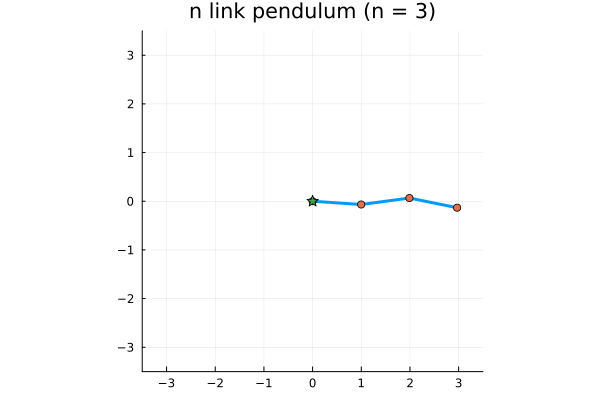

In [3]:
using IJulia
IJulia.display("image/gif", read("pendulum_3.gif"))

In [4]:
simulate_and_render(6; fixed_pivot = true)

Saved GIF as: pendulum_6.gif


[ Info: Saved animation to /home/jovyan/Julia-Exploration/pendulum_6.gif


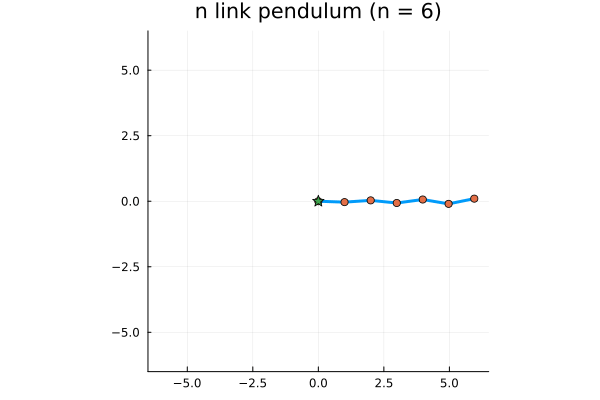

In [5]:
using IJulia
IJulia.display("image/gif", read("pendulum_6.gif"))

In [8]:
simulate_and_render(10; fixed_pivot = true)

Saved GIF as: pendulum_10.gif


[ Info: Saved animation to /home/jovyan/Julia-Exploration/pendulum_10.gif


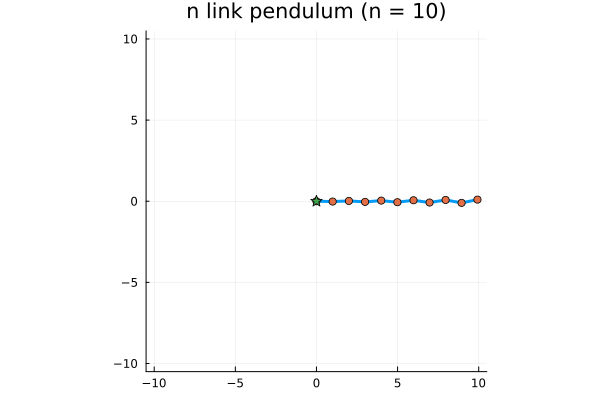

In [10]:
using IJulia
IJulia.display("image/gif", read("pendulum_10.gif"))

In [12]:
simulate_and_render(3; fixed_pivot = false)

Saved GIF as: pendulum_3.gif


[ Info: Saved animation to /home/jovyan/Julia-Exploration/pendulum_3.gif


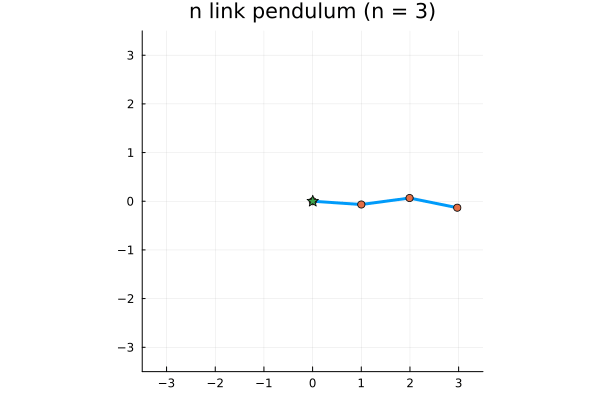

In [14]:
using IJulia
IJulia.display("image/gif", read("pendulum_3.gif"))